# Terrorist Network Analysis

## Read the data and filter out US data

In [1]:
import networkx as nx
import matplotlib.pyplot as plt
import random
import pandas as pd
import io
import math
from itertools import combinations
import datetime
from gurobipy import *

In [2]:
dataset = pd.read_csv('GTD Database1.csv',encoding='latin1')
df = pd.DataFrame(dataset)
df = pd.DataFrame(df.loc[df['country_txt']== 'United States'], columns = ['iyear','imonth','iday','country_txt','targtype1_txt','gname','latitude','longitude'])
df.drop(df.index[df['gname']=='Unknown'], inplace = True)
#df=df.sample(n=500)
df['iday'].replace({0:15}, inplace=True)

/Users/sushama/opt/anaconda3/lib/python3.8/site-packages/IPython/core/interactiveshell.py:3165: DtypeWarning: Columns (4,31,33,54,61,62,63,76,79,90,92,94,96,114,115,121) have mixed types.Specify dtype option on import or set low_memory=False.
  has_raised = await self.run_ast_nodes(code_ast.body, cell_name,


#### Graph Creation

In [3]:
G=nx.DiGraph()
for i in range(len(list(df.index))):
    G.add_node(list(df.index)[i])
#print(G.number_of_nodes())

## Function to determine difference in number of days between two events

In [4]:
def date_gap(i,j,k,l,m,n):
    a=datetime.datetime(i,j,k)
    b=datetime.datetime(l,m,n)
    return (a-b).days

## Function to determine proximity between two events

In [5]:
def haversine(a,b,x,y): # Code taken from https://stackoverflow.com/questions/4913349/haversine-formula-in-python-bearing-and-distance-between-two-gps-points
    lon1=a
    lat1=b
    lon2=x
    lat2=y
    lon1, lat1, lon2, lat2 = map(math.radians, [lon1, lat1, lon2, lat2])
    dlon = lon2 - lon1 
    dlat = lat2 - lat1 
    a = math.sin(dlat/2)**2 + math.cos(lat1) * math.cos(lat2) * math.sin(dlon/2)**2
    c = 2 * math.asin(math.sqrt(a)) 
    r = 3956 # This value does *not* affect the spanning tree calculations! 
    # It is the radius of the earth (needed for the Haversine calculation) in miles. It would be 6371 for kilometers. 
    return c*r

## Forming the graph of events with calculated weights based on spatial, temporal and target group parameters

### Temporal relation:
##### The temporal relation is calculated using the "date_gap" function and the edge weight based on temporal distance is calculated using -
$e^{-|t_i-t_j|} \leq \tau$
##### where, $\tau$ is an arbitrarily large time value to set an upper limit for time-based connection
### Spatial relation:
##### The spatial distance is calculated using the "haversine" function. The difference in distance is calculated and the edge weight is set using - 
$e^{-|d_i-d_j|} \leq \delta $
### Target type:
##### If the target type for event i and j is the same, then edge weight of 1 is assigned

In [6]:
time_limit = 7000 #in days
dist_limit= 2000
for (i,j) in combinations(range(len(list(df.index))),2):
    
    diff_days = date_gap(df.iat[i,0],df.iat[i,1],df.iat[i,2],df.iat[j,0],df.iat[j,1],df.iat[j,2])
    diff_dist = haversine(df.iat[i,7],df.iat[i,6],df.iat[j,7],df.iat[j,6])

    curr=0
    
    if(diff_days>0)and(diff_days<time_limit)and(diff_dist<dist_limit): 
        curr+= math.e**(-1*diff_dist-1*diff_days)
        if(df.iat[i,4].casefold()==df.iat[j,4].casefold()):
            curr+=1
            G.add_edge(df.index[j],df.index[i], weight = curr)
        
    if(diff_days<0)and(abs(diff_days)<time_limit)and(diff_dist<dist_limit): 
        curr+= math.e**(-1*diff_dist-1*abs(diff_days))
        if(df.iat[i,4].casefold()==df.iat[j,4].casefold()):
            curr+=1
            G.add_edge(df.index[i],df.index[j], weight = curr)

#### Checking for bidirectional edges

In [7]:
for i in G.nodes():
    for j in G.nodes():
        if (G.has_edge(i, j) and G.has_edge(j, i)):
            print("Bidirectional edges")

#### Plotting the graph and number of edges

186789

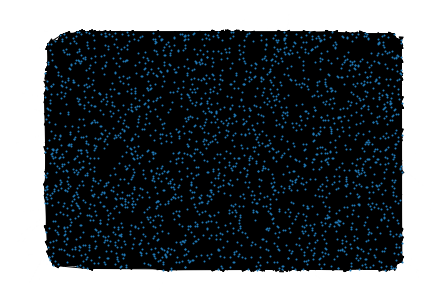

In [8]:
pos=nx.random_layout(G)
nx.draw(G,pos, node_size=1)
G.number_of_edges()

## Determining the closeness centrality for each node (event)

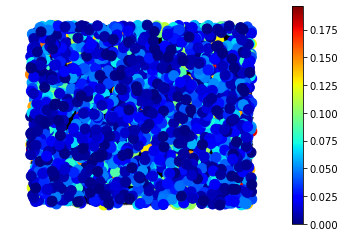

In [9]:
G=G.reverse(copy=True)
close=nx.closeness_centrality(G, wf_improved=True)

colors = [close[i] for i in G.nodes()]

ec = nx.draw_networkx_edges(G, pos, alpha=0.2)
nc = nx.draw_networkx_nodes(G, pos, nodelist=G.nodes(), node_color=colors, 
                            node_size=100, cmap=plt.cm.jet)
plt.colorbar(nc)
plt.axis('off')
plt.show()

#### Sorting events based on closeness centrality

In [10]:
close_sorted=sorted(close.items(), key=lambda item:item[1], reverse=True)
#print(len(close_sorted))
maxClose=max(close.values())
close_centralization = sum(maxClose - close[i] for i in G.nodes())/((G.number_of_nodes()-1)*(G.number_of_nodes()-2)/(2*G.number_of_nodes()-3))
print(close_centralization)

0.30883287953083194


#### Printing the top n influential events

In [11]:
top_n=0
for i in close_sorted:
    if i[1]>0:
        top_n+=1
print("Top events in the order of influence:")
for i in range(0,top_n):
    print(df.loc[df.index == close_sorted[i][0]]['gname'].to_string())

Top events in the order of influence:
251    Revolutionary Force 26
252    Revolutionary Force 26
37    Strikers
243    Black Nationalists
570    Black Nationalists
593    Black Nationalists
228    Left-Wing Militants
229    Left-Wing Militants
230    Left-Wing Militants
234    Black Nationalists
347    Black Panthers
348    Black Nationalists
371    Left-Wing Militants
386    Black Panthers
55    Armed Revolutionary Independence Movement (MIRA)
56    Armed Revolutionary Independence Movement (MIRA)
377    Left-Wing Militants
57    Armed Revolutionary Independence Movement (MIRA)
64    Left-Wing Militants
420    Left-Wing Militants
125    Revolutionary Force 9
126    Revolutionary Force 9
129    Revolutionary Force 9
449    Left-Wing Militants
144    Puerto Rican Resistance Movement
145    Puerto Rican Resistance Movement
498    Left-Wing Militants
146    Black Panthers
147    Black Panthers
148    Black Panthers
170    Left-Wing Militants
172    Left-Wing Militants
249    Armed Revolu

#### Forming dictionary of (influencer, influenced) pair

In [12]:
# Re-reversing all edges 
G=G.reverse(copy=True)
influence={}
# Finding pairs of influencer, influenced based on 'events' graph (G) edges for top N nodes
for i in range(0,top_n):
    influence[i]=list(G.out_edges(close_sorted[i][0]))
print(len(influence[0])) 

458


## List of events influenced by top n events with maximum closeness centrality

In [13]:
for i in range(len(influence)):
    print("Events influenced by", df.loc[df.index == influence[i][0][0]]['gname'].to_string(),':')
    for j in range(len(influence[i])):
        print('\t', df.loc[df.index == influence[i][j][1]]['gname'].to_string())
    print('\n')

Events influenced by 251    Revolutionary Force 26 :
	 245    Puerto Rican Nationalists
	 283    Black Afro Militant Movement
	 287    Black Nationalists
	 291    Black Nationalists
	 301    Black Nationalists
	 302    Black Nationalists
	 303    Black Nationalists
	 315    Left-Wing Militants
	 347    Black Panthers
	 348    Black Nationalists
	 362    Jewish Defense League (JDL)
	 371    Left-Wing Militants
	 377    Left-Wing Militants
	 386    Black Panthers
	 389    Seattle Liberation Front
	 415    Left-Wing Militants
	 420    Left-Wing Militants
	 430    Weather Underground, Weathermen
	 446    Weather Underground, Weathermen
	 449    Left-Wing Militants
	 489    Weather Underground, Weathermen
	 492    Left-Wing Militants
	 493    Left-Wing Militants
	 498    Left-Wing Militants
	 570    Black Nationalists
	 593    Black Nationalists
	 599    Armed Commandos of Liberation
	 600    Armed Commandos of Liberation
	 601    Armed Commandos of Liberation
	 602    Armed Commandos of Li

## Forming graph with groups as nodes, edges weighed according to number of events influenced

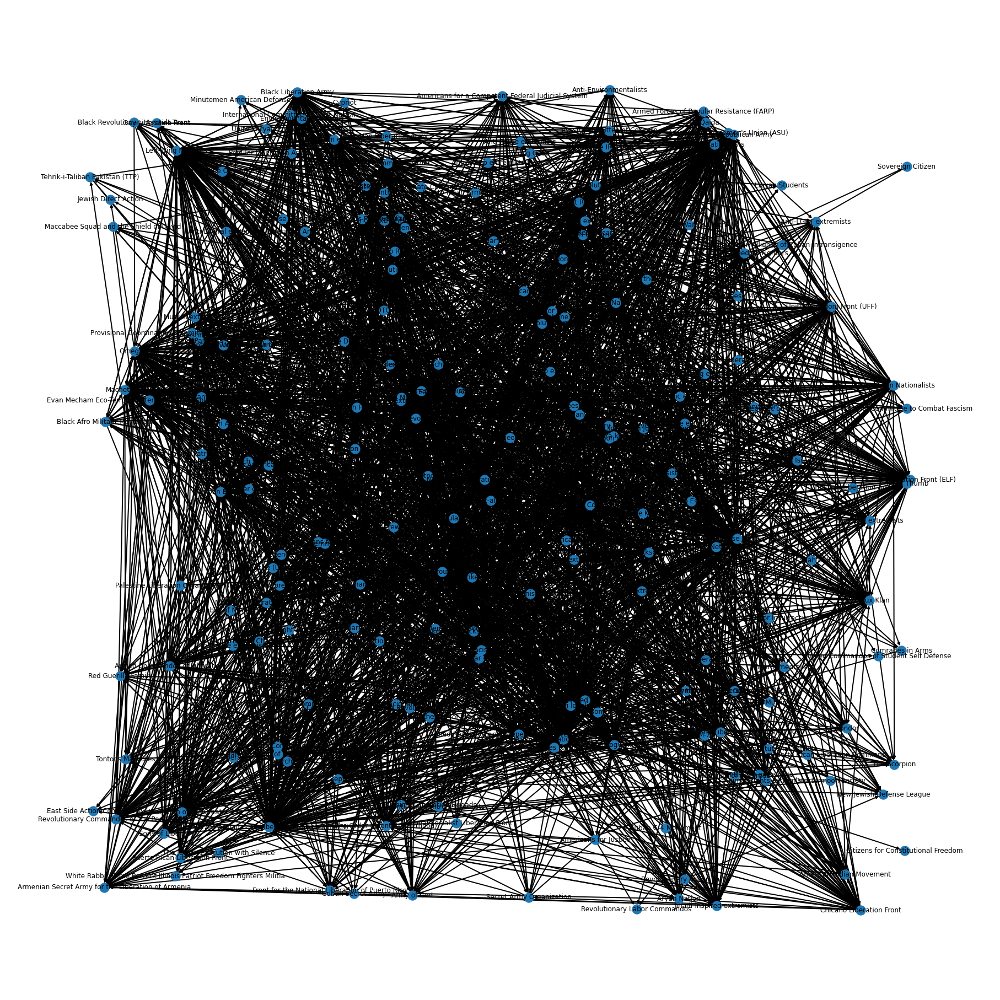

In [14]:
H=nx.DiGraph()
w={}
for i in range(len(influence)):
    for j in range(len(influence[i])):
        a=df[df.index ==influence[i][j][0]]['gname'].values[0]
        b=df[df.index ==influence[i][j][1]]['gname'].values[0]
        if H.has_edge(a,b):
            H[a][b]['weight']+=1           
        else:        
            H.add_node(a)
            H.add_node(b)
            w[a,b]=1
            H.add_edge(a,b,weight=1)

#              
# for i in range(len(influence)):
#     for j in range(len(influence[i])):
#         a=df[df.index ==influence[i][j][0]]['gname'].values[0]
#         b=df[df.index ==influence[i][j][1]]['gname'].values[0]
#         H.add_edge(a,b,weight=w[a,b])
 
to_remove = [(a,b) for a,b, attrs in H.edges(data=True) if attrs["weight"] <=100]
H.remove_edges_from(to_remove)

to_remove = [i for i in H.nodes() if H.degree(i)==0]
H.remove_nodes_from(to_remove)

pos=nx.random_layout(H)
labels = nx.get_edge_attributes(H,'weight')
nx.draw(H,pos, node_size=300, with_labels=True, width=2)
#nx.draw(H,pos, node_size=50, with_labels=True, width=2)
plt.gcf().set_size_inches(25, 25)
#nx.draw_networkx_edge_labels(H,pos,edge_labels=labels)
#
#H.number_of_edges()

#### Removing self loops (trivial case)

In [15]:
for (i,j) in list(H.edges()):
    if (i==j):
        H.remove_edge(i,j)
print(H.number_of_edges())

3075


#### Checking for bidirectional edges

In [16]:
count=0
for i in H.nodes():
    for j in H.nodes():
        if (H.has_edge(i, j) and H.has_edge(j, i)):
            count+=1
            #print(i,j)
#print(count, "Bidirectional edges")

#### Sorting edges (pairs of groups) based on edge weight (number of events influenced) 

In [17]:
sorted_groups=sorted(H.edges(data=True),key=lambda x:x[2].get('weight',1), reverse=True)
# print(sorted_groups)
#for i in range(len(sorted_groups)):
for i in range(5):
    print(sorted_groups[i][0],'influences', sorted_groups[i][2]['weight'], 'events carried out by', sorted_groups[i][1])

Left-Wing Militants influences 2779 events carried out by Fuerzas Armadas de Liberacion Nacional (FALN)
Army of God influences 2226 events carried out by Anti-Abortion extremists
Armed Revolutionary Independence Movement (MIRA) influences 2027 events carried out by Fuerzas Armadas de Liberacion Nacional (FALN)
Fuerzas Armadas de Liberacion Nacional (FALN) influences 1626 events carried out by Omega-7
Fuerzas Armadas de Liberacion Nacional (FALN) influences 1550 events carried out by United Freedom Front (UFF)


## Determining the closeness centrality for each node (group)

In [18]:
H=H.reverse()

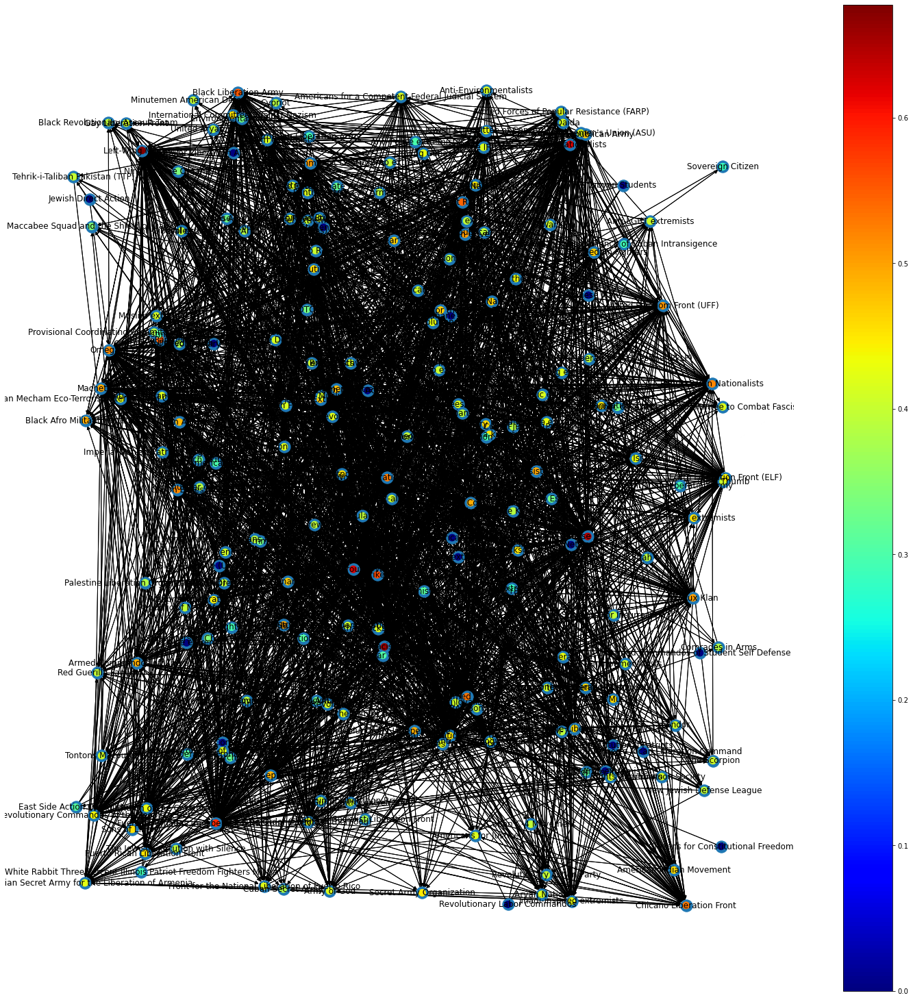

In [19]:
close_group=nx.closeness_centrality(H, wf_improved=True)
#print(len(close_group))
#print(len(set(close_group)))
colors_group = [close_group[i] for i in H.nodes()]
nx.draw(H,pos, with_labels=True,)
ec_group = nx.draw_networkx_edges(H, pos, alpha=1)
nc_group = nx.draw_networkx_nodes(H, pos, nodelist=H.nodes(), node_color=colors_group, 
                            node_size=100, cmap=plt.cm.jet)
plt.colorbar(nc_group)
plt.axis('off')
plt.gcf().set_size_inches(20, 20)
plt.show()

#### Sorting events based on closeness centrality

In [20]:
close_sorted_groups=sorted(close_group.items(), key=lambda item:item[1], reverse=True)
#print(len(close_sorted))
print(close_sorted_groups[0])

('Left-Wing Militants', 0.6776532209127782)


In [21]:
maxClose_group=max(close_group.values())
close_group_centralization = sum(maxClose_group - close_group[i] for i in H.nodes())/((H.number_of_nodes()-1)*(H.number_of_nodes()-2)/(2*H.number_of_nodes()-3))
print(close_group_centralization)

0.598601212226752


#### Printing the top n influential groups

In [22]:
top_n_groups=10
print("Top",top_n_groups,"Influential nodes:")
for i in range(0,top_n_groups):
    print("Terrorist group", close_sorted_groups[i][0], "demonstrates a closeness of",close_sorted_groups[i][1])

Top 10 Influential nodes:
Terrorist group Left-Wing Militants demonstrates a closeness of 0.6776532209127782
Terrorist group White supremacists/nationalists demonstrates a closeness of 0.6641001564945227
Terrorist group Jewish Defense League (JDL) demonstrates a closeness of 0.6468508017803791
Terrorist group Black Nationalists demonstrates a closeness of 0.6265095815986063
Terrorist group Weather Underground, Weathermen demonstrates a closeness of 0.6225938967136151
Terrorist group Fuerzas Armadas de Liberacion Nacional (FALN) demonstrates a closeness of 0.5859707263186964
Terrorist group Strikers demonstrates a closeness of 0.5612113998545262
Terrorist group Black Liberation Army demonstrates a closeness of 0.5518837865605452
Terrorist group Black Panthers demonstrates a closeness of 0.5503592457136928
Terrorist group Student Radicals demonstrates a closeness of 0.5443443905692809


## Relaxed star structure (Representative)

### Data: 
##### 1. H (V , E) - Graph with terrorist groups as vertices and number of events they influence as edge weight
##### 2. $\lambda$ - an arbitrary constant to set a limit on the maximum number of connections between leaves
### Variables: 
##### $x_i = {1,0} ; 1$ if the node is the center of the star, 0 otherwise
##### $y_i = {1,0}; 1$ if the node is a leaf, 0 otherwise
##### $k_i$$_j = {1,0};$ 1 if connection between leaf nodes are allowed, 0 otherwise
##### $w_i$$_j = {1,0};$ 1 if there exists an edge between $y_i$ and $y_j$, 0 otherwise - linearization variable
### Constraints
##### $\sum\limits_{i,j\in V} k_i$$_j\leq \lambda$
##### $w_i$$_j\leq y_i$
##### $w_i$$_j\leq y_j$
##### $w_i$$_j\geq y_i+y_j-1$
##### $k_i$$_j\leq w_i$$_j$
##### $y_i\leq \sum\limits_{(i,j) \in E}x_j$
##### $\sum\limits_{i \in V} x_i = 1$
### Objective
##### Maximize $\sum\limits_{i \in V }y_i$

In [25]:
model=Model("Relaxed_star")
y=model.addVars(H.nodes(), vtype=GRB.BINARY, obj=-1)
x=model.addVars(H.nodes(), vtype=GRB.BINARY, obj=0)
k={}
w={}
for (i,j) in combinations(H.nodes(),2):
    w[i,j]=model.addVar(vtype=GRB.BINARY)
    
for (i,j) in combinations(H.nodes(),2):
    k[i,j] = model.addVar(vtype=GRB.BINARY, obj=0)

model.addConstr(quicksum(k[i,j] for (i,j) in combinations(H.nodes(),2)) <=20)

for (i,j) in combinations(H.nodes(),2):
    model.addConstr(w[i,j]<=y[i])
    model.addConstr(w[i,j]<=y[j])
    model.addConstr(w[i,j]>=y[i]+y[j]-1)

for (i,j) in combinations(H.nodes(),2):
    model.addConstr(k[i,j] <= w[i,j])    

for i in H.nodes():
    model.addConstr(y[i]<=quicksum(x[j] for j in H.neighbors(i)))

model.addConstr(quicksum(x[i] for i in H.nodes())==1)
    
model.optimize()

Gurobi Optimizer version 9.1.2 build v9.1.2rc0 (mac64)
Thread count: 8 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 91380 rows, 46010 columns and 231413 nonzeros
Model fingerprint: 0xfc6d8e91
Variable types: 0 continuous, 46010 integer (46010 binary)
Coefficient statistics:
  Matrix range     [1e+00, 1e+00]
  Objective range  [1e+00, 1e+00]
  Bounds range     [1e+00, 1e+00]
  RHS range        [1e+00, 2e+01]
Found heuristic solution: objective 0.0000000
Presolve removed 31596 rows and 26089 columns
Presolve time: 1.73s
Presolved: 59784 rows, 19921 columns, 142555 nonzeros
Variable types: 0 continuous, 19921 integer (19921 binary)

Deterministic concurrent LP optimizer: primal and dual simplex (primal and dual model)
Showing first log only...

Presolved: 59784 rows, 19921 columns, 142555 nonzeros

Concurrent spin time: 0.16s

Solved with primal simplex (dual model)

Root relaxation: objective -1.190000e+02, 31491 iterations, 0.44 seconds

    Nodes   

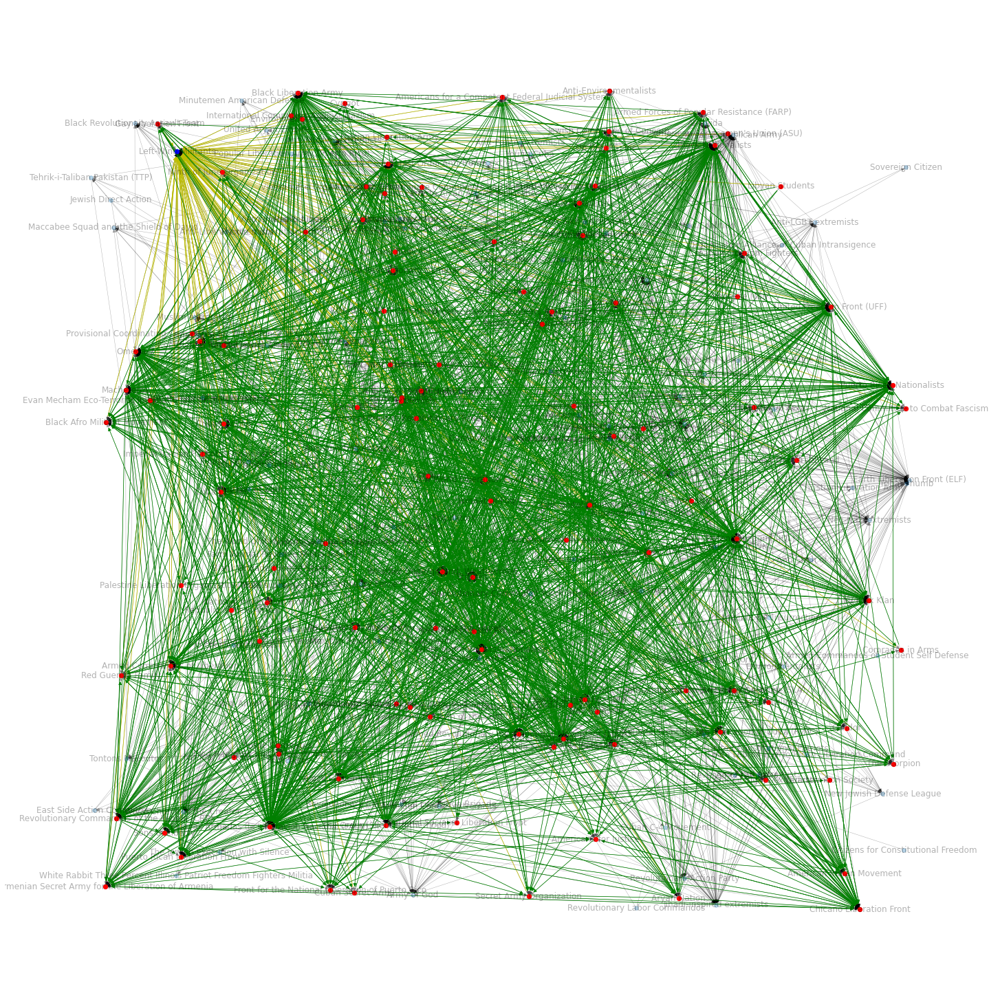

['Left-Wing Militants']
[('Revolutionary Force 26', 'Black Nationalists'), ('Revolutionary Force 26', 'Black Panthers'), ('Revolutionary Force 26', 'Armed Revolutionary Independence Movement (MIRA)'), ('Revolutionary Force 26', 'Strikers'), ('Puerto Rican Nationalists', 'Revolutionary Force 26'), ('Puerto Rican Nationalists', 'Black Afro Militant Movement'), ('Puerto Rican Nationalists', 'Black Nationalists'), ('Puerto Rican Nationalists', 'Black Panthers'), ('Puerto Rican Nationalists', 'Jewish Defense League (JDL)'), ('Puerto Rican Nationalists', 'Weather Underground, Weathermen'), ('Puerto Rican Nationalists', 'Armed Commandos of Liberation'), ('Puerto Rican Nationalists', 'Armed Revolutionary Independence Movement (MIRA)'), ('Puerto Rican Nationalists', 'Black Liberation Army'), ('Puerto Rican Nationalists', 'Secret Cuban Government'), ('Puerto Rican Nationalists', 'Sons of Liberty'), ('Puerto Rican Nationalists', 'Puerto Rican Liberation Front'), ('Puerto Rican Nationalists', 'Jew

In [26]:
star_nodes=[i for i in H.nodes() if y[i].X==1]
center=[i for i in H.nodes() if x[i].X==1]
added_edges=[(i,j) for (i,j) in H.edges() if i in star_nodes and j in star_nodes]
star_edges=[(i,j) for (i,j) in H.edges() if i in star_nodes and j in center]
total_edges=added_edges+star_edges

nx.draw(H, pos, with_labels=True, node_size=30, width=0.5, alpha=0.3)
nx.draw_networkx_nodes(H, pos, nodelist=star_nodes, node_color='r', node_size=40)
nx.draw_networkx_nodes(H, pos, nodelist=center, node_color='b', node_size=40)
nx.draw_networkx_edges(H, pos, edgelist=star_edges, edge_color='y', width=0.75)
nx.draw_networkx_edges(H, pos, edgelist=added_edges, edge_color='g', width=0.75)
plt.gcf().set_size_inches(20, 20)
plt.show()
print(center)
print(added_edges)